<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Data-overview." data-toc-modified-id="Data-overview.-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Data overview.</a></span></li><li><span><a href="#Data-preprocessing." data-toc-modified-id="Data-preprocessing.-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Data preprocessing.</a></span></li><li><span><a href="#Data-analysis." data-toc-modified-id="Data-analysis.-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Data analysis.</a></span></li><li><span><a href="#Research-focus:-opening-a-coffee-shop." data-toc-modified-id="Research-focus:-opening-a-coffee-shop.-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Research focus: opening a coffee shop.</a></span><ul class="toc-item"><li><span><a href="#How-many-coffee-shops-are-there-in-the-dataset?-Which-areas-have-the-most-of-them,-what-are-the-features-of-their-location?" data-toc-modified-id="How-many-coffee-shops-are-there-in-the-dataset?-Which-areas-have-the-most-of-them,-what-are-the-features-of-their-location?-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>How many coffee shops are there in the dataset? Which areas have the most of them, what are the features of their location?</a></span></li><li><span><a href="#Are-there-24-hour-coffee-shops?" data-toc-modified-id="Are-there-24-hour-coffee-shops?-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Are there 24-hour coffee shops?</a></span></li><li><span><a href="#What-are-the-ratings-of-coffee-shops?-How-are-they-distributed-by-districts?" data-toc-modified-id="What-are-the-ratings-of-coffee-shops?-How-are-they-distributed-by-districts?-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>What are the ratings of coffee shops? How are they distributed by districts?</a></span></li><li><span><a href="#What-is-the-cost-of-a-cappuccino-cup-worth-focusing-on-when-opening-and-why?" data-toc-modified-id="What-is-the-cost-of-a-cappuccino-cup-worth-focusing-on-when-opening-and-why?-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>What is the cost of a cappuccino cup worth focusing on when opening and why?</a></span></li><li><span><a href="#Recommendation-for-opening-a-new-establishment." data-toc-modified-id="Recommendation-for-opening-a-new-establishment.-4.5"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>Recommendation for opening a new establishment.</a></span></li></ul></li><li><span><a href="#Conclusions." data-toc-modified-id="Conclusions.-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Conclusions.</a></span></li><li><span><a href="#Presentation." data-toc-modified-id="Presentation.-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Presentation.</a></span></li></ul></div>

# Market Analysis of Public Catering Establishments in Moscow.

**Project Description.**

The client, an investment fund, is considering the prospects of opening a public catering establishment in Moscow. At the first stage, the client is unsure about the type of establishment it will be: a café, restaurant, pizzeria, pub, or bar, as well as the location, menu, and pricing.

It is necessary to conduct a market study of Moscow, identify interesting features, and present the results, which will help the investor in making a decision about the development strategy.

In addition to the general market study, a specific analysis and recommendations should be provided for opening a particular type of establishment, namely a coffee shop in Moscow.

**Data.**

Dataset of public catering establishments in Moscow, compiled based on data from Yandex Maps and Yandex Business services as of the summer of 2022.

**Data Description.**

File:
_moscow_places.csv_:

- _`name`_ — name of the establishment;
- _`address`_ — address of the establishment;
- _`category`_ — category of the establishment, such as “café,” “pizzeria,” or “coffee shop”;
- _`hours`_ — information on the days and hours of operation;
- _`lat`_ — latitude of the geographic location of the establishment;
- _`lng`_ — longitude of the geographic location of the establishment;
- _`rating`_ — rating of the establishment based on user reviews on Yandex Maps (the highest rating is 5.0);
- _`price`_ — price category of the establishment, such as "average," "below average," "above average," and so on;
- _`avg_bill`_ — a string that stores the average bill range, for example:
    - “Average bill: 1000–1500 ₽”;
    - “Price of a cappuccino: 130–220 ₽”;
    - “Price of a beer: 400–600 ₽”;
    - and so on;
- _`middle_avg_bill`_ — a number representing the estimate of the average bill, based only on values from the _`avg_bill`_ column starting with "Average bill":
    - If a price range is given, the median of the two values is recorded;
    - If a single price is listed, that value is recorded;
    - If no value is present or the string does not begin with "Average bill," no value is recorded.
- _`middle_coffee_cup`_ — a number representing the estimated price of one cappuccino, based only on values from the _`avg_bill`_ column starting with "Price of a cappuccino":
    - If a price range is given, the median of the two values is recorded;
    - If a single price is listed, that value is recorded;
    - If no value is present or the string does not begin with "Price of a cappuccino," no value is recorded.
- _`chain`_ — a binary value `0` or `1`, indicating whether the establishment is part of a chain (there may be errors for small chains):
    - 0 — the establishment is not part of a chain
    - 1 — the establishment is part of a chain
- _`district`_ — the administrative district where the establishment is located, for example, Central Administrative District;
- _`seats`_ — number of seating places.

**Research Objectives:**
- Identify interesting features of the public catering market in Moscow.
- Present the results that will help in choosing a suitable public catering location for investors.
- Provide recommendations for opening a new coffee shop in Moscow.

**Research Plan:**
 1. Data overview.
 2. Data preprocessing.
 3. Data analysis.
 4. Research focus: opening a coffee shop.
 5. Conclusions.
 6. Presentation.

In [94]:
# We import all the necessary libraries in this cell
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import json
import requests
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from IPython.display import Image

## Data overview.

In [50]:
try:
    df = pd.read_csv('/datasets/moscow_places.csv')
except:
    df = pd.read_csv('https://...path.../datasets/moscow_places.csv')

In [51]:
df.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0


In [52]:
# let's create a function to familiarize with the data 
def all_info(data):
    print('''\033[36m\033[1m\033[4m Information about the data in the dataset: \033[0m
    \033[36m\033[1m |
     V \033[0m''')
    print(data.info())
    
    print('''
    \033[36m\033[1m\033[4m Checking for missing values: \033[0m
    \033[36m\033[1m |
     V \033[0m''')
    print(data.isnull().sum())
    
    print('''
    \033[36m\033[1m\033[4m Checking for obvious duplicates: \033[0m
    \033[36m\033[1m |
     V \033[0m''')
    print(data.duplicated().sum())

In [53]:
# let's call the function to familiarize ourselves with the data 
all_info(df)

 Information about the data in the dataset: 
     |
     V 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
N

The data types correspond to the contents of the columns.

There are missing values in the following columns:
- _hours_ — we do not have information about the operating hours of the establishments, so we will leave the missing values unfilled;
- _price_ — the price category may vary depending on the type of establishment and location; however, without knowing the exact order cost and pricing of the establishment, we cannot reliably determine the price category by analogy with similar types of establishments in the same area, so we will leave the missing values unfilled;
- _avg_bill_ — the average order cost may differ from establishment to establishment, and calculating the median or mean based on the type of establishment and/or location to fill in missing values may distort the data, so we will leave the missing values unfilled;
- _middle_avg_bill_ — similarly to the previous point, we will leave the missing values unfilled;
- _middle_coffee_cup_ — similarly to the previous point, we will leave the missing values unfilled;
- _seats_ — we do not have data on the number of seating places, so we will leave the missing values unfilled.

No obvious duplicates were found.

In [54]:
# Let's check for implicit duplicates by comparing names and addresses.
# Create a new column 'key' by combining the values from the 'name' and 'address' columns.
# Convert the values in the column to lowercase to ensure case-insensitive comparison and remove spaces.
df['key'] = df['name'] + '_' + df['address']
df['key'] = df['key'].str.lower()
df['key'] = df['key'].str.replace(' ', '')

In [55]:
# Let's check if there are duplicates.
# To do this, we'll create a 'duplicates' column with boolean values indicating duplicates.
# Sort the duplicates by the value True and save them to a separate dataset for display.
df['duplicates'] = df.duplicated(subset='key', keep=False)
duplicates = pd.DataFrame(df[df['duplicates'] == True])
duplicates

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,key,duplicates
189,Кафе,кафе,"Москва, парк Ангарские Пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN,"кафе_москва,паркангарскиепруды",True
215,Кафе,кафе,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN,"кафе_москва,паркангарскиепруды",True
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,"morepoke_москва,волоколамскоешоссе,11,стр.2",True
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,"morepoke_москва,волоколамскоешоссе,11,стр.2",True
2211,Раковарня Клешни и Хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0,"раковарняклешниихвосты_москва,проспектмира,118",True
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,"раковарняклешниихвосты_москва,проспектмира,118",True
3091,Хлеб да Выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0,"хлебдавыпечка_москва,ярцевскаяулица,19",True
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0,"хлебдавыпечка_москва,ярцевскаяулица,19",True
4613,Cafe 13,кафе,"Москва, Мясницкая улица, 13, стр. 11",Центральный административный округ,пн-чт 10:00–22:00; пт 10:00–19:00,55.762779,37.633079,4.3,NaN,NaN,NaN,NaN,0,200.0,"cafe13_москва,мясницкаяулица,13,стр.11",True
4780,Cafe13,ресторан,"Москва, Мясницкая улица, 13, стр. 11",Центральный административный округ,пн-чт 10:00–22:00; пт 10:00–18:00,55.762748,37.633176,4.3,NaN,NaN,NaN,NaN,0,200.0,"cafe13_москва,мясницкаяулица,13,стр.11",True


There are implicit duplicates in the data. Let's get rid of them.

In [56]:
df.drop_duplicates(subset='key', keep=False, inplace=True)

## Data preprocessing.

In [57]:
# Let's create a "street" column with street names from the address column
df['street'] = df['address'].str.split(', ').apply(lambda x: x[1])
df.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,key,duplicates,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,"wowфли_москва,улицадыбенко,7/1",False,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,"четырекомнаты_москва,улицадыбенко,36,корп.1",False,улица Дыбенко


In [58]:
# Create a column "is_24/7" indicating that the institution is open daily and around the clock (24/7)
# Pre-fill in the gaps in the "hours" column with the value "No data" ("Нет данных")
df['hours'] = df['hours'].fillna('Нет данных')

In [59]:
# Create a function and fill the column "is_24/7" with the value "True" or "False" depending on the value in the column "hours"
def tell_me_true (row):
        if 'ежедневн' in row and 'круглосуточн' in row:
            return True
        else:
            return False
df['is_24/7'] = df['hours'].apply(tell_me_true)

## Data analysis.

**Let's see which categories of establishments are represented in the data and examine the number of catering facilities by category. Let's determine how the establishments are divided into categories.**

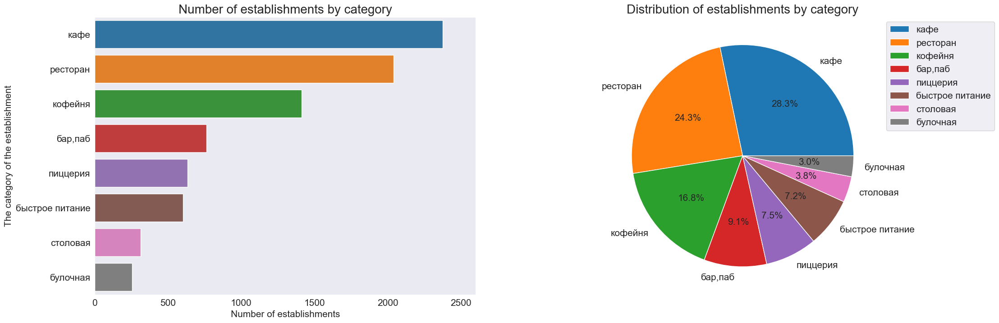

In [60]:
n_estab = pd.DataFrame(df.groupby('category')['name'].count()).reset_index().sort_values(by='name', ascending=False)
plt.figure(figsize=(24, 8))
plt.rcParams['font.size'] = 15
ax = plt.subplot(1, 2, 1)
ax = sns.barplot(y='category', x='name', data=n_estab)
#for i in ax.containers:
#    ax.bar_label(i, fontsize = 15)
plt.xlim(0, 2600)
plt.title('Number of establishments by category', fontsize = 20)
plt.xlabel('Number of establishments', fontsize = 15)
plt.ylabel('The category of the establishment', fontsize = 15)

ax = plt.subplot(1, 2, 2)
plt.pie(n_estab['name'],
        labels = n_estab['category'].values,
        autopct = '%.1f%%')
plt.legend(bbox_to_anchor=(1,1), loc='upper left')
plt.title('Distribution of establishments by category', fontsize = 20)
plt.show()

The data includes the largest number of cafés and restaurants: 2,378 and 2,043 establishments, or 28% and 24% of the dataset, respectively.

The fewest entries are bakeries and canteens: 256 and 315 establishments, or 3% and 3.7%, respectively.

Coffee shops account for 16.8% of the establishments in the dataset. This is almost twice as many as the next most frequent category (bars, pubs) and about one-third less than the "Restaurant" category.

**Let's determine the number of seats in places by category. Let's analyze the results.**

In [61]:
# Let's determine the maximum number of places found in the establishments
df['seats'].max()

1288.0

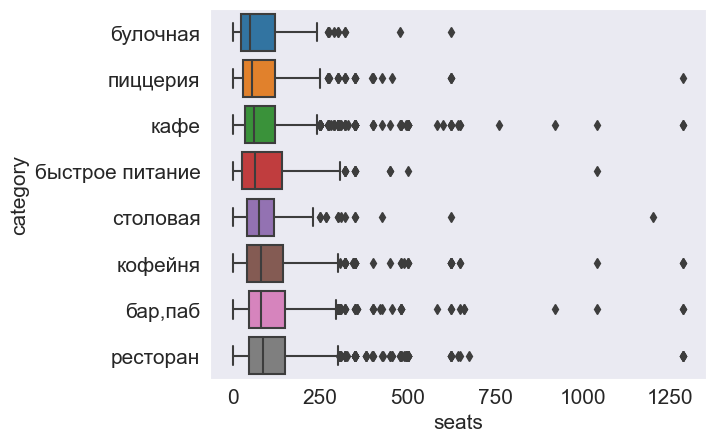

In [62]:
# Creating a list of categories sorted by median
sorted_categories = df.groupby('category')['seats'].median().sort_values().index.tolist()

# Passing the sorted column 'category' to boxplot()
ax = sns.boxplot(x='seats', y='category', data=df, order=sorted_categories)



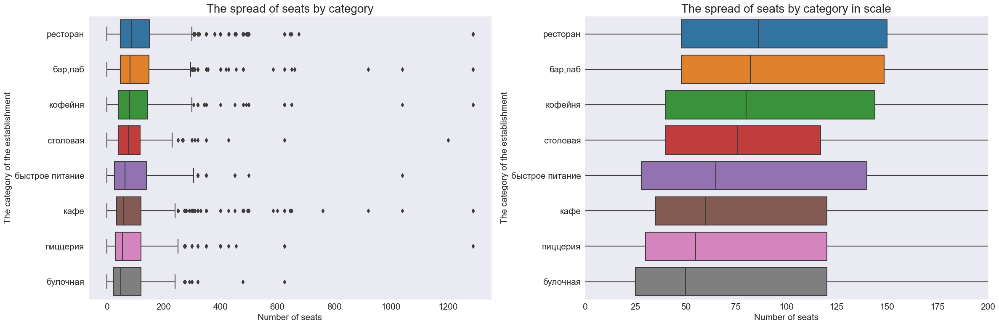

In [63]:
# Let's build a box plot to assess the variation in seating capacity depending on the category
# Set the scale on the x-axis (seating capacity) to cut off outliers and better visualize the main distribution
# Create a list of categories sorted by median and use it when plotting the graph
sort_cat = df.groupby('category')['seats'].median().sort_values(ascending=False).index.tolist()
plt.figure(figsize=(24, 8))
ax = plt.subplot(1, 2, 1)
ax = sns.boxplot(x='seats', y='category', data=df,order=sort_cat)
plt.title('The spread of seats by category', fontsize = 20)
plt.xlabel('Number of seats')
plt.ylabel('The category of the establishment')
ax = plt.subplot(1, 2, 2)
ax = sns.boxplot(x='seats', y='category', data=df, order=sort_cat)
plt.xlim(0,200)
plt.title('The spread of seats by category in scale', fontsize = 20)
plt.xlabel('Number of seats')
plt.ylabel('The category of the establishment')
plt.tight_layout()
plt.show()

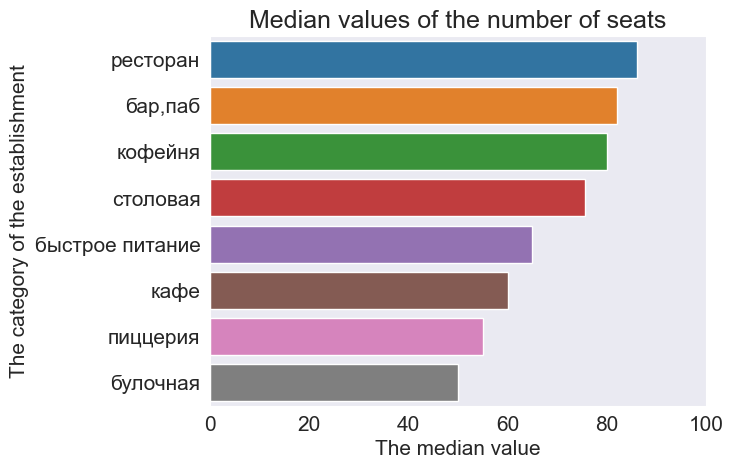

In [64]:
# Let's build a bar chart to visualize the median value of the number of places by category
med_seats = df.groupby(['category'], as_index = False)['seats'].median().sort_values(by='seats', ascending=False)
ax = sns.barplot(y='category', x='seats', data=med_seats)
#for i in ax.containers:
#    ax.bar_label(i)
plt.xlim(0, 100)
plt.title('Median values of the number of seats')
plt.xlabel('The median value', fontsize = 15)
plt.ylabel('The category of the establishment', fontsize = 15)
plt.show()

- The maximum number of seats found in establishments: 1,288 pcs.
- Significant outliers are visible in the distribution of the number of seats, so the median value is best suited for estimating this parameter.
- By median, the most seats are in restaurants (86), the least in bakeries (50)

**Let's consider the ratio of network and non-network establishments in the dataset, determine which establishments are more.**

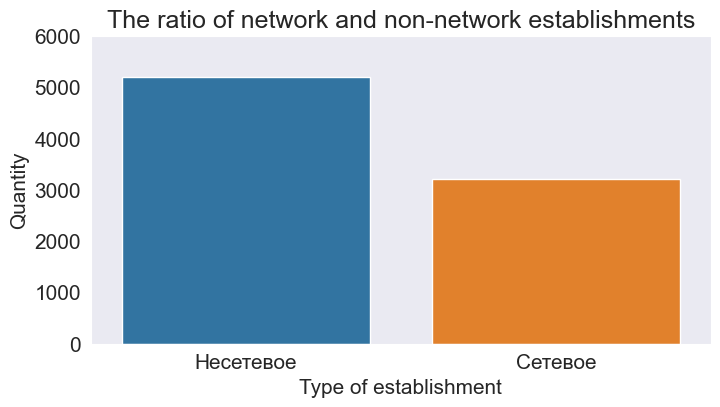

In [65]:
# Let's create a separate dataframe with a column of the institution's category
# and the "Network" ("Сетевое") or "Non-network" ("Не сетевое") sign
is_chain = pd.concat([df['category'], df['chain'].replace({0:'Несетевое',1:'Сетевое'})], axis=1)
a = pd.DataFrame(is_chain.groupby(['chain'], as_index = False)['category'].count())
# Let's build a bar chart
sns.set_style('dark')
plt.figure(figsize=(8, 4))
ax= sns.barplot(x='chain', y='category', data=a)
#for i in ax.containers:
#    ax.bar_label(i)
plt.ylim(0, 6000)
plt.title('The ratio of network and non-network establishments')
plt.xlabel('Type of establishment')
plt.ylabel('Quantity')
plt.show()

There are more non-chain establishments in the dataset.

**Let's determine which categories of establishments are more often online**

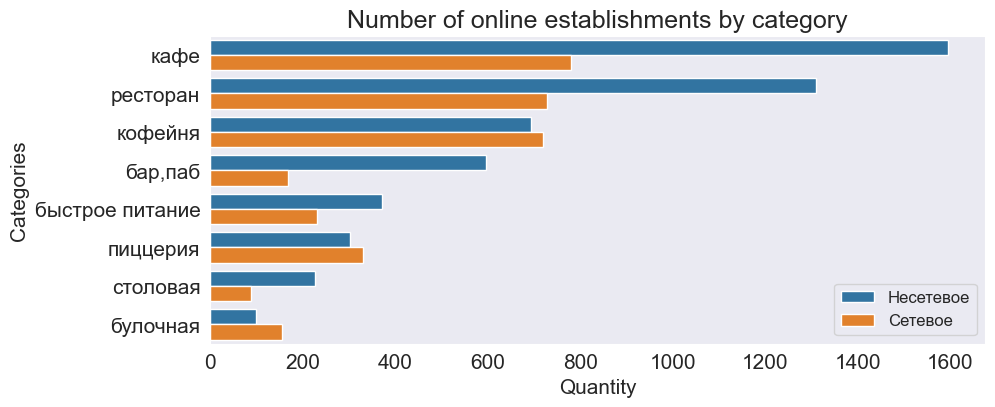

In [66]:
# let's group the data by category and "network" attribute and calculate the number
name_chain = pd.concat([is_chain, df['name']], axis=1)
b = name_chain.groupby(['category', 'chain'], as_index = False)[['name']].count().sort_values(by='name', ascending=False)
# Let's build a bar chart
sns.set_style('dark')
plt.figure(figsize=(10, 4))
sns.barplot(x='name', y='category', data=b, hue='chain')
plt.title('Number of online establishments by category')
plt.xlabel('Quantity')
plt.ylabel('Categories')
plt.legend(loc='lower right', fontsize=12)
plt.show()

More often they are chain coffee shops, pizzerias and bakeries.

**We will find the top 15 popular chains in Moscow by the names of establishments. "Popularity" is the number of establishments of this chain in the region.**

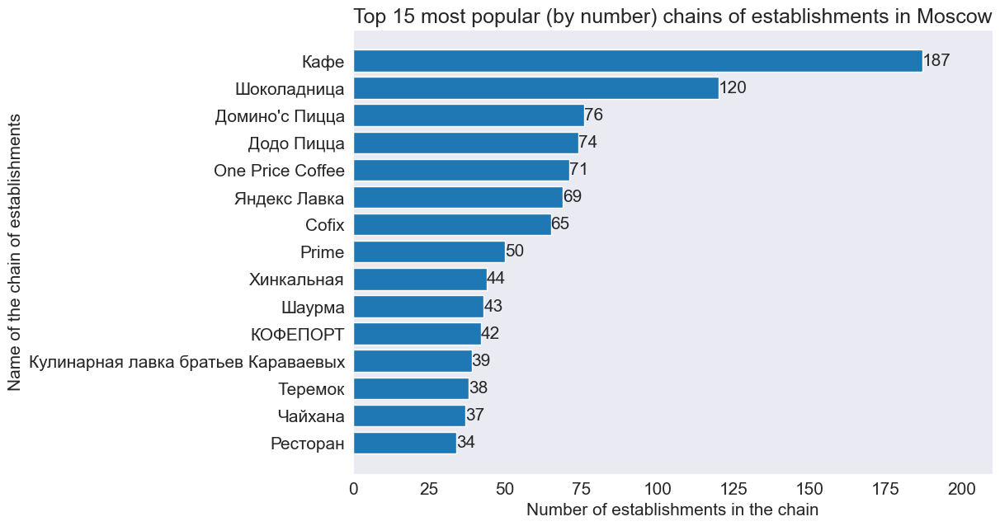

In [67]:
# let's group the data and find the top 15 by the number of establishments
grup_chains = df.groupby('name')['category'].count().reset_index()
top_15 = grup_chains.sort_values(by='category', ascending=False).head(15)
top_15 = top_15.sort_values(by='category')
# Let's build a bar chart
plt.figure(figsize=(10, 7))
plt.barh(top_15['name'], top_15['category'])
plt.xlabel('Number of establishments in the chain')  
plt.ylabel('Name of the chain of establishments')
plt.title('Top 15 most popular (by number) chains of establishments in Moscow')
for i, value in enumerate(top_15['category']):
    plt.text(value, i, str(value), ha='left', va='center')
plt.xlim(0, 210)
plt.show()

Cafes ("Cafes" "Кафе") and coffee shops ("Chocoladnitsa "Шоколадница") are in the top in popularity by a large margin. Next come the pizzerias. The names are really well-known and often catch the eye in Moscow. Calling the cafe "Cafe" is probably a legacy of the Soviet past.

**Let's see which administrative districts of Moscow are present in the dataset. Let's display the total number of establishments and the number of establishments of each category by district.**

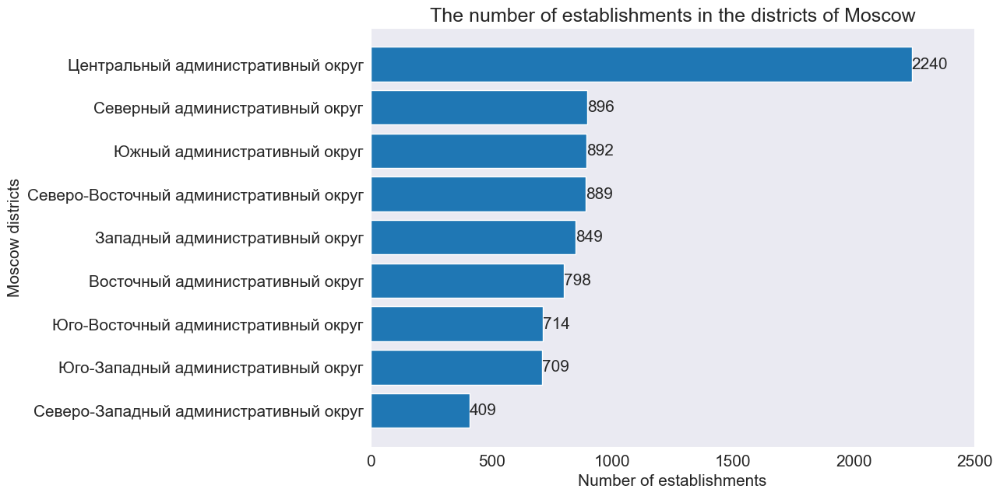

In [68]:
# Let's display the administrative districts of Moscow and the total number of establishments by district.
grup = df.groupby('district')['name'].count().reset_index()
grup = grup.sort_values(by='name')
plt.figure(figsize=(10, 7))
plt.barh(grup['district'], grup['name'])
plt.xlabel('Number of establishments')  
plt.ylabel('Moscow districts')
plt.title('The number of establishments in the districts of Moscow')
for i, value in enumerate(grup['name']):
    plt.text(value, i, str(value), ha='left', va='center')
plt.xlim(0, 2500)
plt.show()

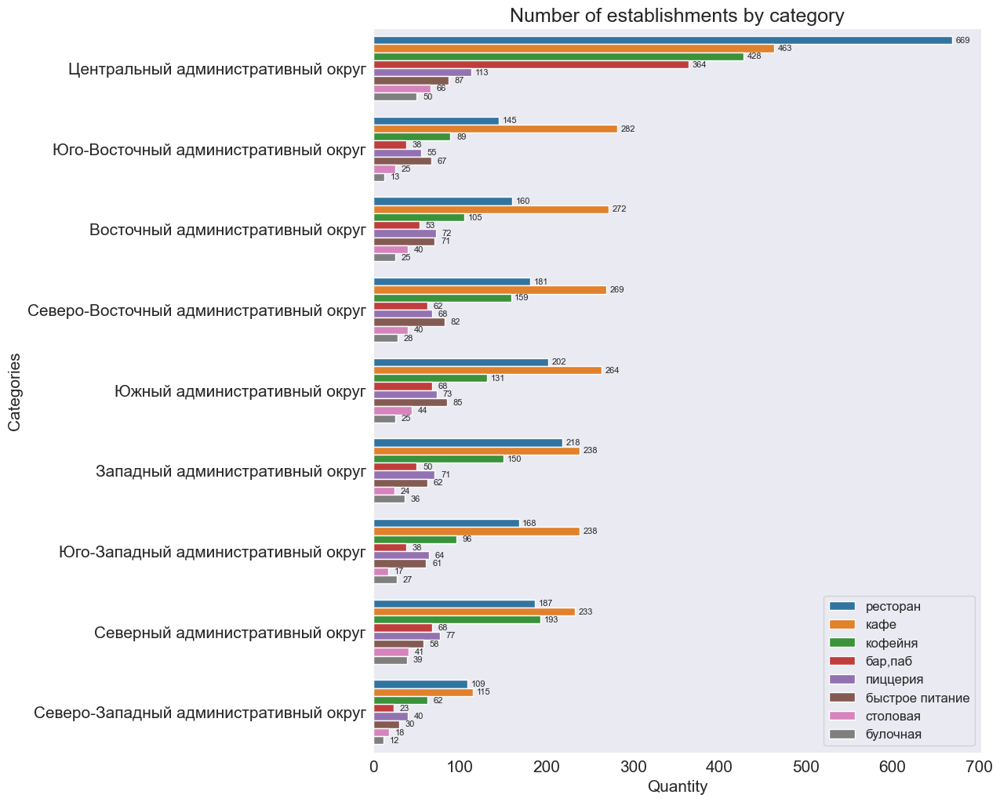

In [69]:
# let's display the number of establishments of each category by district
a = df.groupby(['district', 'category'], as_index = False)[['name']].count().sort_values(by='name', ascending=False)
sns.set_style('dark')
plt.figure(figsize=(10, 12))
ax = sns.barplot(x='name', y='district', data=a, hue='category')
for p in ax.patches:
    ax.annotate(format(p.get_width(), '.0f'), (p.get_width(), p.get_y() + p.get_height() / 2),
                ha = 'center', va = 'center', xytext = (10, 0), textcoords = 'offset points', fontsize=8)
plt.title('Number of establishments by category')
plt.xlabel('Quantity')
plt.ylabel('Categories')
plt.legend(loc='lower right', fontsize=12)
plt.show()

- Most establishments are located in the Central Administrative District (CAD).
- In all districts except CAD, cafés are the most common. In CAD, restaurants are the most common, and cafés are in second place.
- In all districts except CAD and the Northern Administrative District (NAD), restaurants are in second place. In NAD, coffee shops are in second place.
- In all districts except NAD, coffee shops are in third place.


**Let's look at the distribution of average ratings by categories of establishments.**

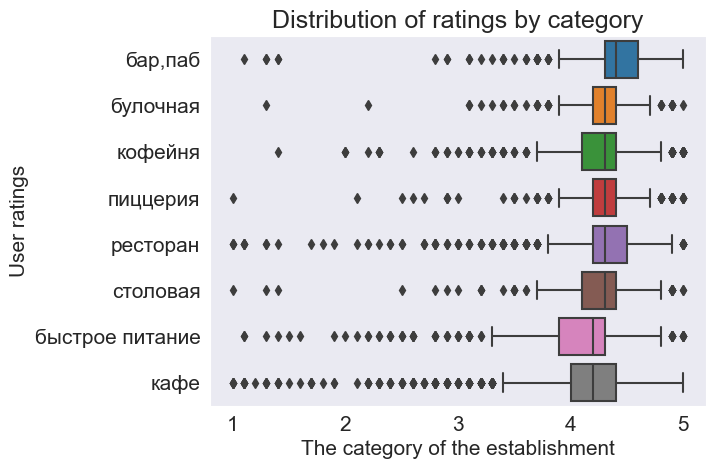

In [70]:
# first, let's look at the distribution of all estimates
sort_rating = df.groupby('category')['rating'].median().sort_values(ascending=False).index.tolist()
ax = sns.boxplot(x='rating', y='category', data=df, order=sort_rating)
plt.xlabel('The category of the establishment')  
plt.ylabel('User ratings')
plt.title('Distribution of ratings by category')
#plt.tight_layout()
plt.show()

In the Cafe category, the most noticeable emissions are in the negative side of the assessment, and in Bakeries there are noticeably fewer negative emissions.  In general, the majority of estimates are in the range from 4 to 4.5.

Let's look at the average ratings.

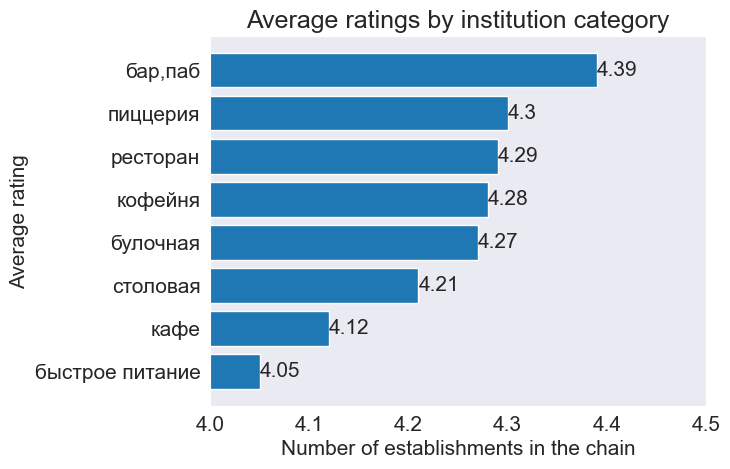

In [71]:
avr_rate = df.groupby('category')['rating'].mean().reset_index().sort_values(by='rating')
avr_rate['rating'] = round(avr_rate['rating'], 2)
# Let's build a bar chart
#plt.figure(figsize=(10, 7))
plt.barh(avr_rate['category'], avr_rate['rating'])
plt.xlabel('Number of establishments in the chain')  
plt.ylabel('Average rating')
plt.title('Average ratings by institution category')
for i, value in enumerate(avr_rate['rating']):
    plt.text(value, i, str(value), ha='left', va='center')
plt.xlim(4, 4.5)
plt.show()

The average ratings for the categories of establishments differ by no more than 0.34. On average, bars/pubs are rated the highest (4.39) and fast food establishments and cafes are rated the lowest (4.05 and 4.12 respectively).

**Let's build a background cartogram (choropleth) with an average rating of establishments in each district.**

In [72]:
# For each district, we calculate the average rating of establishments that are located on its territory
rating_reg = df.groupby('district', as_index=False)['rating'].mean()

In [73]:
# Let's read the JSON file using a request by URL and save it to a variable
# On a local computer, I would use the "open()" function,
# but in that case, a user on another PC wouldn't be able to open the file
url = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
response = requests.get(url)
state_geo = response.json()
#print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

In [74]:
# moscow_lat - latitude of the center of Moscow, moscow_lng - longitude of the center of Moscow
moscow_lat, moscow_lng = 55.751244, 37.618423
# creating a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# creating a choropleth using the Choropleth constructor and adding it to the map
Choropleth(
    geo_data=state_geo,
    data=rating_reg,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.7,
    legend_name='Average rating of establishments by district',
).add_to(m)
# we display the card
# m

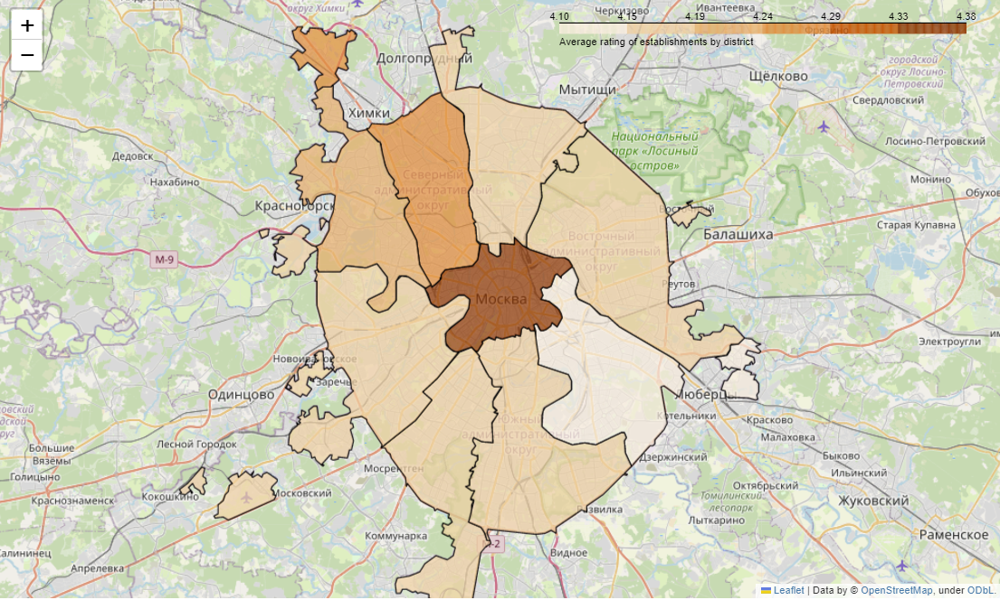

In [76]:
# GitHub does not support interactive elements such as maps.
# Here I am inserting a screenshot to demonstrate the result.
# In the code above, the map output is commented out (# m)
Image(filename='map_1.png')

It can be seen that the ratings are higher in the center of Moscow. The lowest ratings are in the southeastern direction. While ratings are rising in the north and north-west direction.

In [77]:
df.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,key,duplicates,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,"wowфли_москва,улицадыбенко,7/1",False,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,"четырекомнаты_москва,улицадыбенко,36,корп.1",False,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,"хазри_москва,клязьминскаяулица,15",False,Клязьминская улица,False


**Let's display all the establishments of the dataset on the map using clusters using the folium library.**

In [78]:
marker_cluster = MarkerCluster().add_to(m)
# Write a function that takes a dataframe row,
# creates a marker at the current point, and adds it to the marker cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
# let's apply the "create_clusters()" function to each row of the dataframe
df.apply(create_clusters, axis=1)
#m

0       None
1       None
2       None
3       None
4       None
        ... 
8401    None
8402    None
8403    None
8404    None
8405    None
Length: 8396, dtype: object

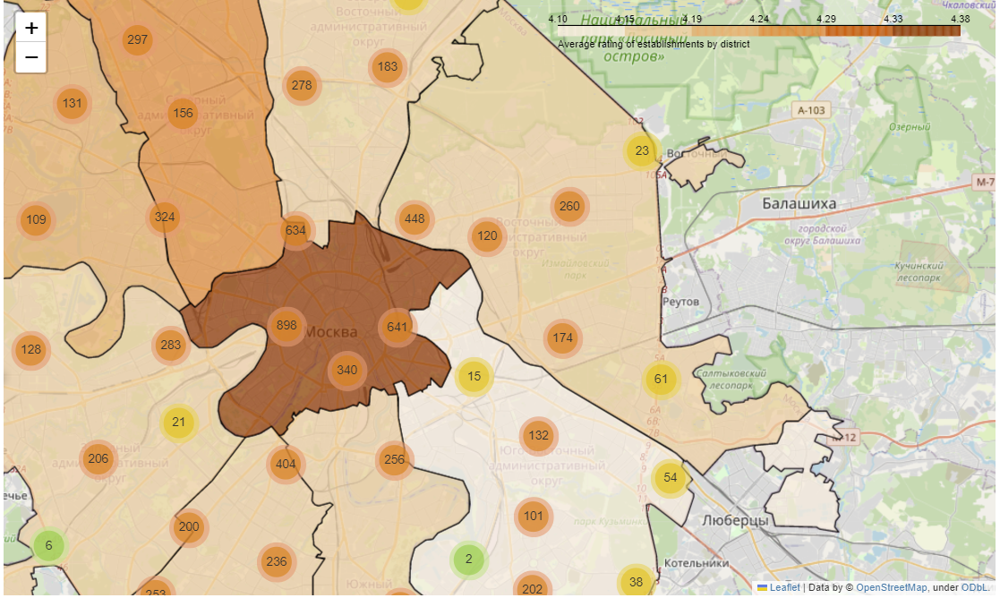

In [79]:
# GitHub does not support interactive elements such as maps.
# Here I am inserting a screenshot to demonstrate the result.
# In the code above, the map output is commented out (#m)
Image(filename='map_2.png')

In [82]:
#import folium
#from folium import plugins

#m = folium.Map([55.751244, 37.618423], zoom_start=8)
#heatmap = df[['lat','lng']]
#m.add_child(plugins.HeatMap(heatmap, radius=14))
#m

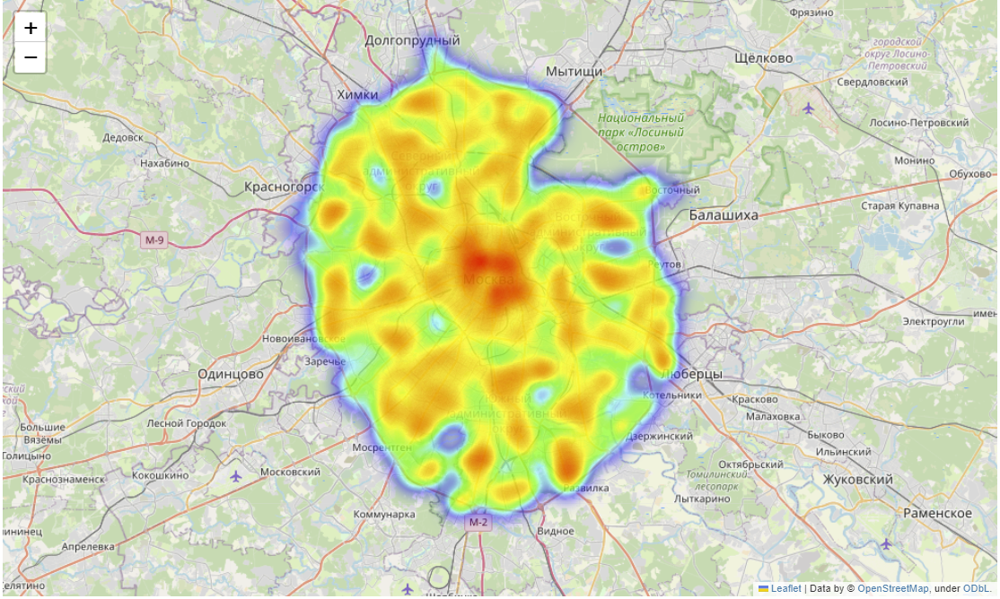

In [83]:
# GitHub does not support interactive elements such as maps.
# Here I am inserting a screenshot to demonstrate the result.
# In the code above, the map output is commented out (#m)
Image(filename='map_3.png')

**Find the top 15 streets by the number of establishments. Let's plot the distribution of the number of establishments and their categories along these streets.**

In [84]:
top_15_streets = df.groupby(['street'], as_index=False)['name'].count().sort_values(by='name', ascending=False).head(15)
top_15_streets

,street,name
1089,проспект Мира,182
773,Профсоюзная улица,122
1086,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


Most of the establishments on Mira Avenue

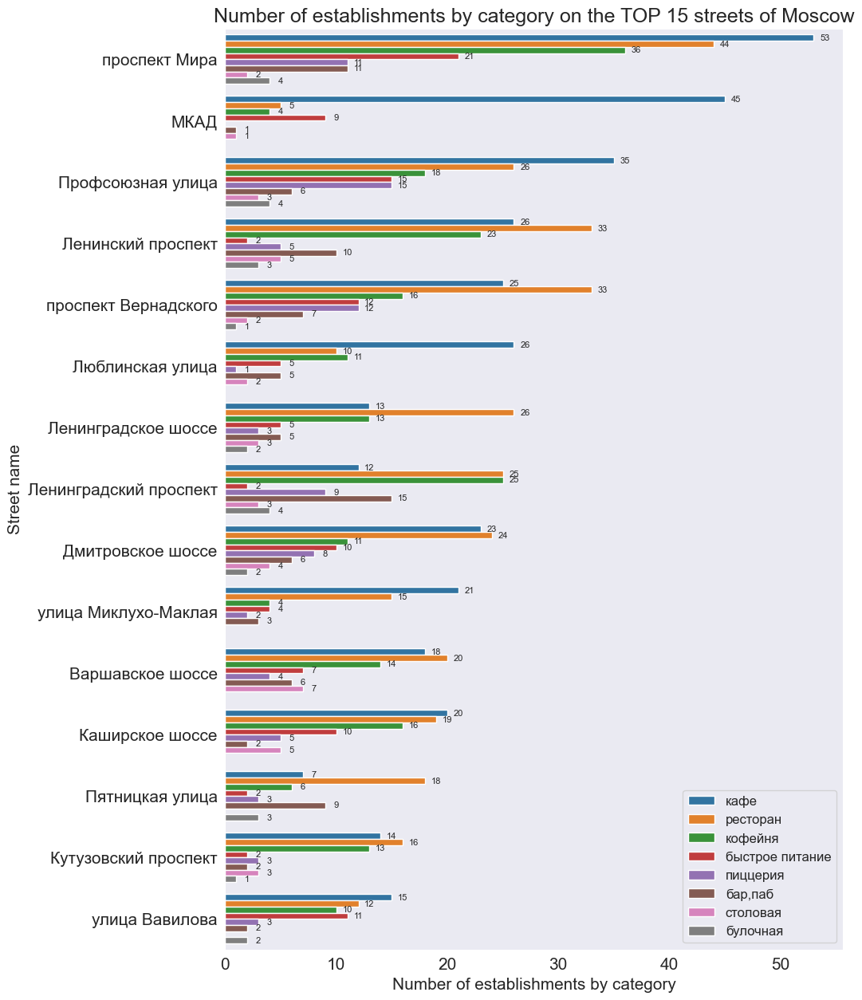

In [85]:
# Let's create a dataset based on the list of the top 15 streets defined above
t15_s = top_15_streets['street'].to_list()
df_t15_s = df[df['street'].isin(t15_s)]
# let's display the number of establishments of each category according to these streets
df_t15_s_cat = df_t15_s.groupby(['street', 'category'], as_index=False)['name'].count().sort_values(by='name', ascending=False)
sns.set_style('dark')
plt.figure(figsize=(10, 15))
ax = sns.barplot(x='name', y='street', data=df_t15_s_cat, hue='category')
for p in ax.patches:
    ax.annotate(format(p.get_width(), '.0f'), (p.get_width(), p.get_y() + p.get_height() / 2),
                ha = 'center', va = 'center', xytext = (10, 0), textcoords = 'offset points', fontsize=8)
plt.title('Number of establishments by category on the TOP 15 streets of Moscow')
plt.xlabel('Number of establishments by category')
plt.ylabel('Street name')
plt.legend(loc='lower right', fontsize=12)
plt.show()

Cafes and restaurants prevail in number in most cases.

The TOP 15 includes quite long streets running through more than one district of Moscow. The MKAD (Moscow Ring Road) generally has a length of more than 100 km. In the list we see 5 avenues and 4 highways. And Pyatnitskaya Street is also located in the CAO (Central Administrative District), where there is already a large density of establishments.

**We will find streets where there is only one catering facility.**

In [86]:
# We will find streets with 1 institution, form a list with their name and filter the dataset by them
bot_streets = df.groupby(['street'], as_index=False)['name'].count().sort_values(by='name')
bot_streets = bot_streets[bot_streets['name'] == 1]
list_bot_streets = bot_streets['street'].to_list()
df_bot_s = df[df['street'].isin(list_bot_streets)]

In [87]:
print('There are only streets with one establishment:', df_bot_s['street'].nunique()) 

There are only streets with one establishment: 458


Let's see what category these establishments are and in which areas of Moscow they are located.

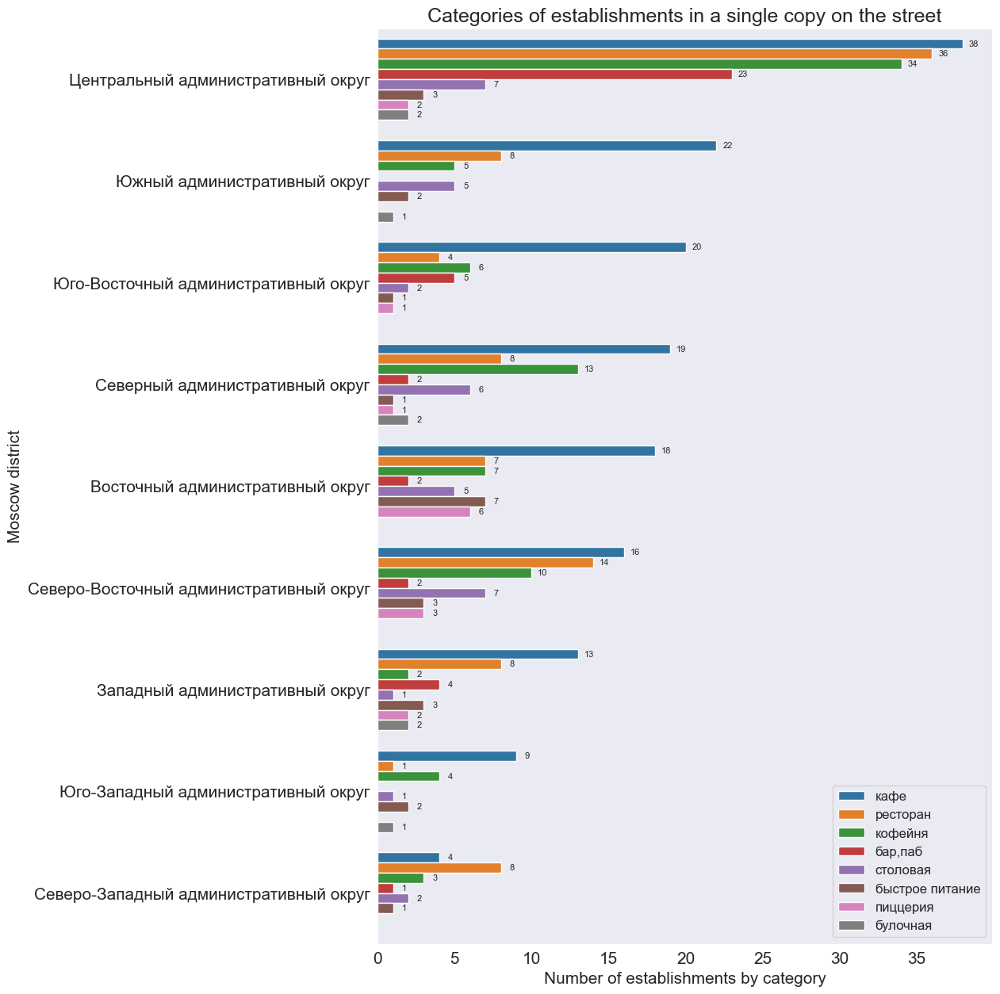

In [88]:
b = df_bot_s.groupby(['district', 'category'], as_index=False)['name'].count().sort_values(by='name', ascending=False)
sns.set_style('dark')
plt.figure(figsize=(10, 15))
ax = sns.barplot(x='name', y='district', data=b, hue='category')
for p in ax.patches:
    ax.annotate(format(p.get_width(), '.0f'), (p.get_width(), p.get_y() + p.get_height() / 2),
                ha = 'center', va = 'center', xytext = (10, 0), textcoords = 'offset points', fontsize=8)
plt.title('Categories of establishments in a single copy on the street')
plt.xlabel('Number of establishments by category')
plt.ylabel('Moscow district')
plt.legend(loc='lower right', fontsize=12)
plt.show()

In a single copy, restaurants are mainly represented on the street. There are most streets with one catering facility in the Central Administrative District.

The leadership of the Central District is explained by the fact that in it, as in the historical center, there are many small streets that make up the old city. Two establishments of the same category will already compete on such small streets. At the same time, the density of establishments there is high due to the high attendance of the area by residents and guests of the capital, and even small streets are being developed by businesses.

**Let's look at the values of the average receipts of establishments.**

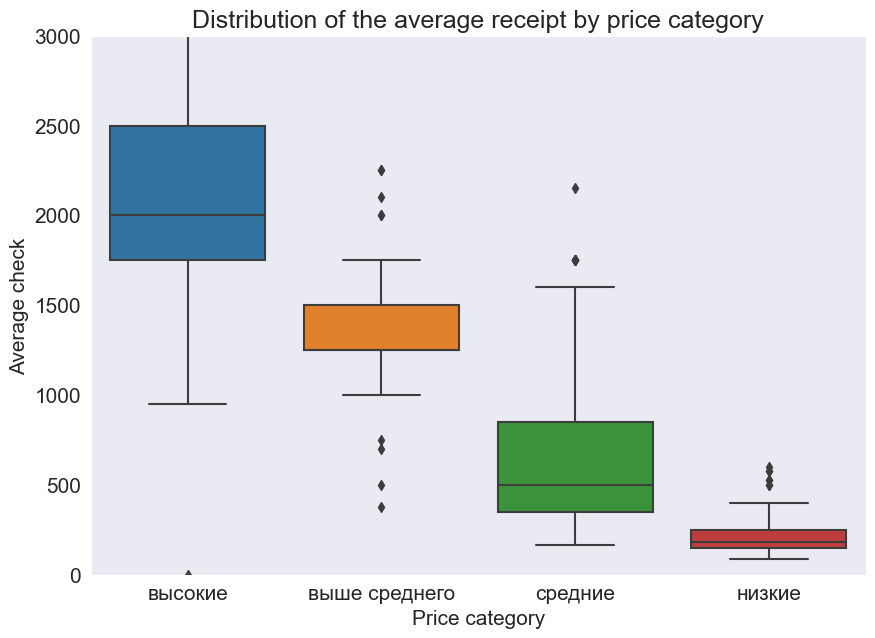

In [89]:
# Let's look at the distribution of the average bill by price category
# Build box plots, set the scale on the y-axis to cut off outliers and improve visualization
plt.figure(figsize=(10, 7))
ax = sns.boxplot(x='price', y='middle_avg_bill', data=df.sort_values(by='middle_avg_bill', ascending=False))
plt.ylim(0,3000)
plt.title('Distribution of the average receipt by price category')
plt.xlabel('Price category')
plt.ylabel('Average check')
plt.show()

Significant up and down emissions are visible in the High and Above Average categories. There are also upward emissions in the Medium and Low categories. However, it is also seen that the categories are clearly separated by the boundary values of the 1st and 3rd quartiles.

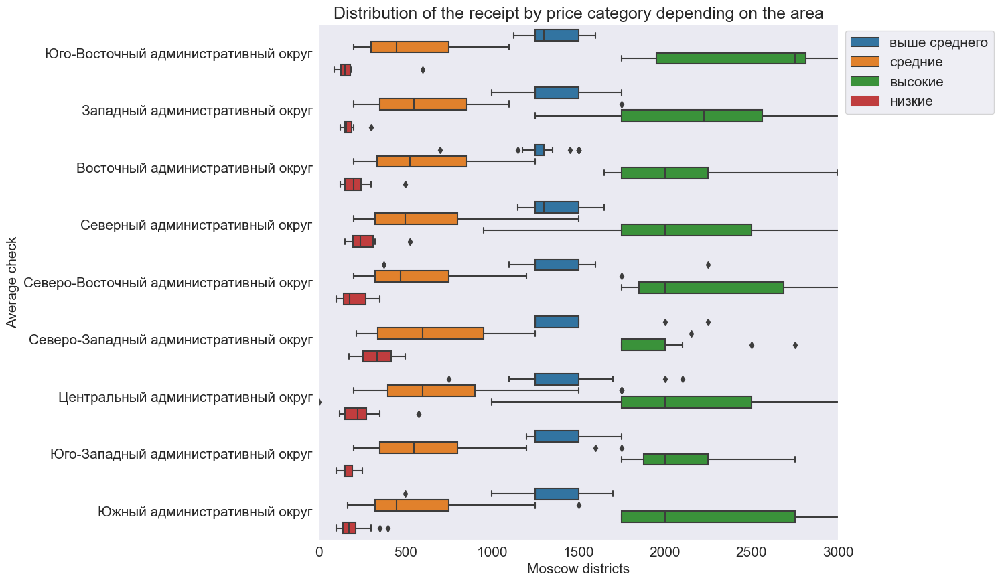

In [90]:
# Let's look at the distribution of the average check by price category depending on the district
sort_dis = df[df['price'] == 'высокие'].groupby('district')['middle_avg_bill'].median().sort_values(ascending=False).index.tolist()
plt.figure(figsize=(10, 10))
ax = sns.boxplot(x='middle_avg_bill', y='district', hue='price', data=df, order=sort_dis)
plt.title('Distribution of the receipt by price category depending on the area')
plt.xlabel('Moscow districts')
plt.ylabel('Average check')
plt.xlim(0,3000)
plt.legend(bbox_to_anchor=(1,1), loc='upper left')
plt.show()

In the Northwestern District, the median of the Low category is almost equal to the 1st quartile of the Above-average category. In other districts, it can be seen that the categories clearly differ in the mass of values.

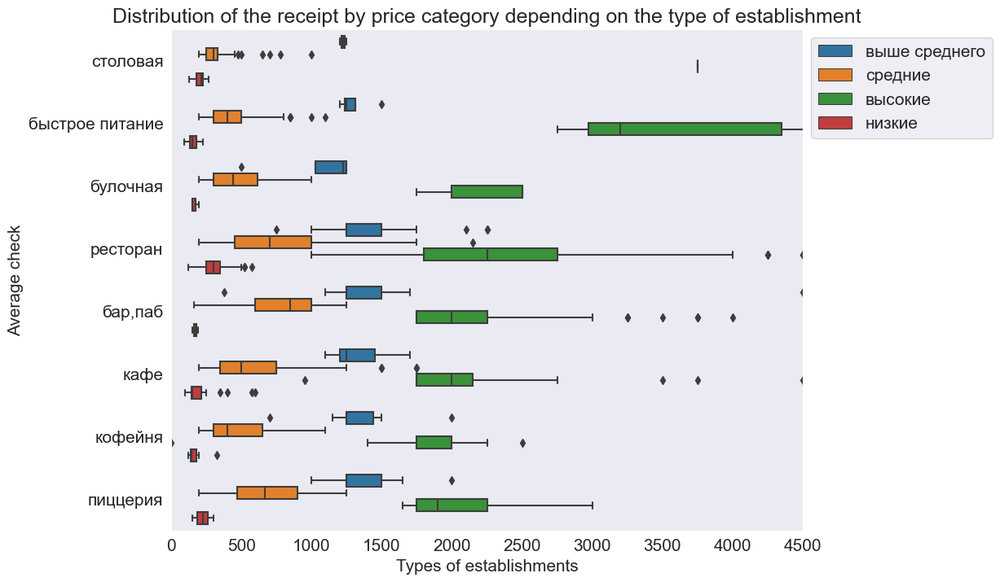

In [91]:
# Let's look at the distribution of the average check by price category, depending on the type of institution
sort_cat_p = df[df['price'] == 'высокие'].groupby('category')['middle_avg_bill'].median().sort_values(ascending=False).index.tolist()
plt.figure(figsize=(10, 8))
ax = sns.boxplot(x='middle_avg_bill', y='category', hue='price', data=df, order=sort_cat_p)
plt.title('Distribution of the receipt by price category depending on the type of establishment')
plt.xlabel('Types of establishments')
plt.ylabel('Average check')
plt.xlim(0,4500)
plt.legend(bbox_to_anchor=(1,1), loc='upper left')
plt.show()

As before, the categories are clearly separated by the boundary values of the 1st and 3rd quartiles.

Interestingly, the average check in the category of High in the median and in the body of the span chart is highest in fast food establishments. Probably because of the home delivery orders.

**Let's calculate the median of the average receipts of establishments from the middle_avg_bill column for each district. Use this value as a price indicator of the area.**

In [92]:
md = df.groupby('district', as_index=False)['middle_avg_bill'].mean()
# Let's build a background cartogram (choropleth) with the obtained values for each district
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=md,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.7,
    legend_name='The median value of the average bill',
).add_to(m1)
#m1

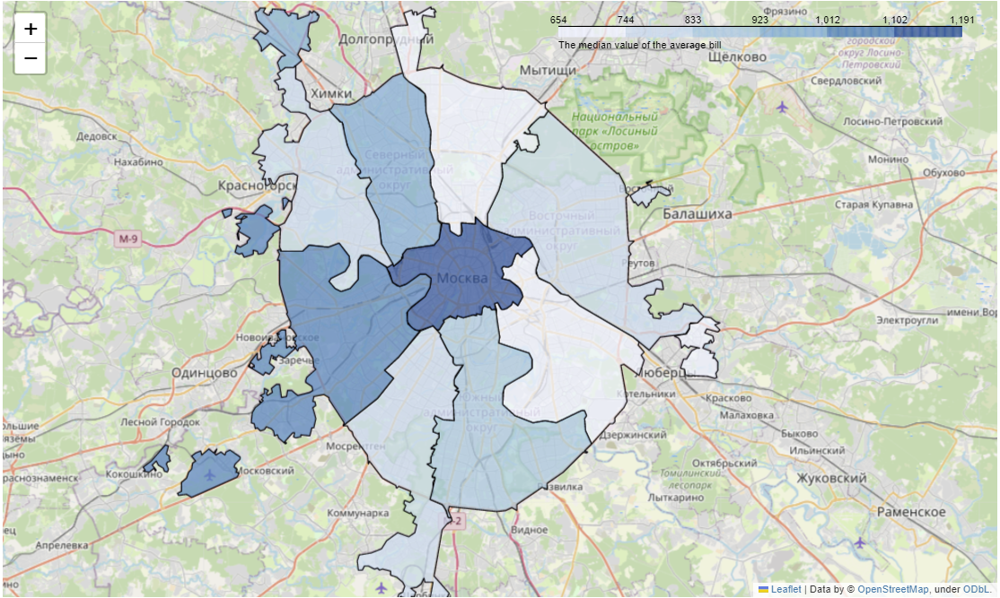

In [93]:
# GitHub does not support interactive elements such as maps.
# Here I am inserting a screenshot to demonstrate the result.
# In the code above, the map output is commented out (#m1)
Image(filename='map_4.png')

The most expensive establishments are in the districts in the center and west of Moscow. Less expensive in the southeastern direction (but the ratings are worse there) and in the northern direction.

## Research focus: opening a coffee shop.

We will formulate and answer a number of questions.

### How many coffee shops are there in the dataset? Which areas have the most of them, what are the features of their location?

In [39]:
# let's create a dataset with coffee shops only
df_caf = df[df['category']=='кофейня']
print('There are ', df[df['category']=='кофейня']['category'].count(), 'coffee shops in the dataset in total.')

There are  1413 coffee shops in the dataset in total.


And, as we determined earlier, coffee shops are in third place in terms of number and account for 16.8% of the dataset.

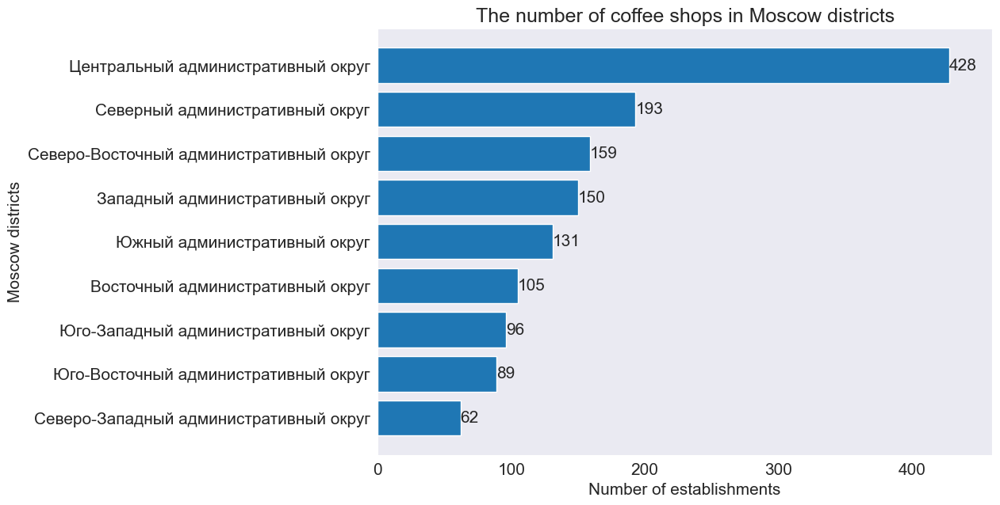

In [40]:
# Let's display the districts of Moscow and the total number of coffee shops by district.
gr = df_caf.groupby('district')['name'].count().reset_index()
gr = gr.sort_values(by='name')
plt.figure(figsize=(10, 7))
plt.barh(gr['district'], gr['name'])
plt.xlabel('Number of establishments')  
plt.ylabel('Moscow districts')
plt.title('The number of coffee shops in Moscow districts')
for i, value in enumerate(gr['name']):
    plt.text(value, i, str(value), ha='left', va='center')
plt.xlim(0, 460)
plt.show()

Most coffee shops are located in the Central Administrative District (CAD), and the fewest are in the Northwestern Administrative District (NWAD). Moreover, there are more than twice as many coffee shops in CAD compared to the next district, the Northern Administrative District (NAD).

### Are there 24-hour coffee shops?

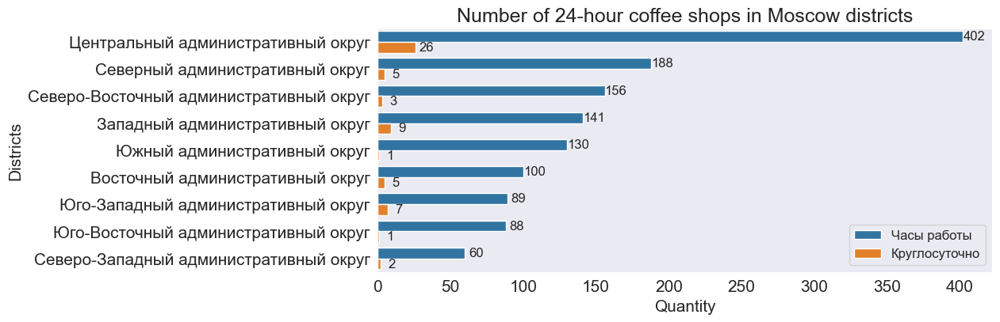

In [41]:
# let's group the data by area and calculate how many round-the-clock coffee shops there are in each
is_24 = pd.concat([df_caf['district'], df_caf['is_24/7'].replace({False:'Часы работы',True:'Круглосуточно'})], axis=1)
gr_24 = pd.concat([is_24, df_caf['name']], axis=1)
c = gr_24.groupby(['district', 'is_24/7'], as_index = False)[['name']].count().sort_values(by='name', ascending=False)
# let's build a columnar graph
sns.set_style('dark')
plt.figure(figsize=(10, 4))
ax = sns.barplot(x='name', y='district', data=c, hue='is_24/7')
for p in ax.patches:
    ax.annotate(format(p.get_width(), '.0f'), (p.get_width(), p.get_y() + p.get_height() / 2),
                ha = 'center', va = 'center', xytext = (10, 0), textcoords = 'offset points', fontsize=12)
plt.title('Number of 24-hour coffee shops in Moscow districts')
plt.xlabel('Quantity')
plt.ylabel('Districts')
plt.legend(loc='lower right', fontsize=12)
plt.show()

There are significantly fewer 24-hour coffee shops than non-24-hour ones. In all districts except the Central Administrative District, there are no more than 9 such caffeine, and in the Southern and Southeastern districts there is generally one each.

### What are the ratings of coffee shops? How are they distributed by districts?

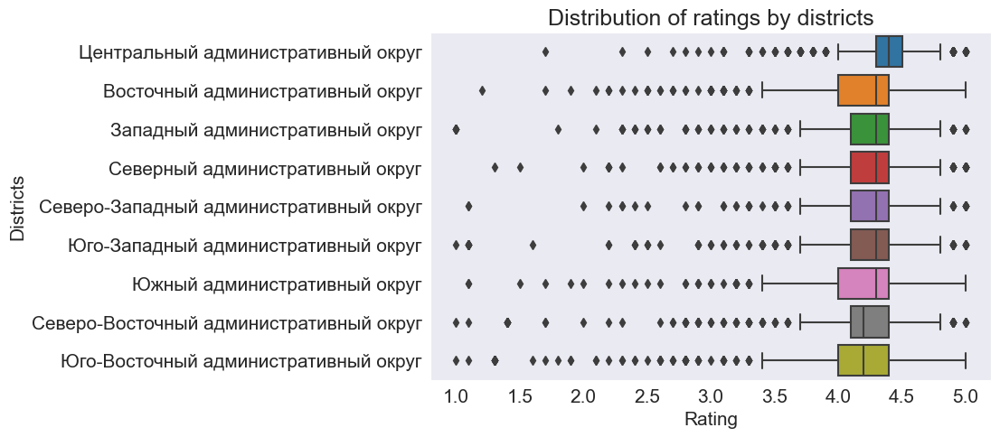

In [42]:
# Let's look at the distribution of ratings by district
plt.figure(figsize=(8, 5))
sort_dis_r = df.groupby('district')['rating'].median().sort_values(ascending=False).index.tolist()
ax = sns.boxplot(x='rating', y='district', data=df, order=sort_dis_r)
plt.title('Distribution of ratings by districts')
plt.xlabel('Rating')
plt.ylabel('Districts')
plt.show()

There are outliers in the rating data, especially noticeable in the Northeastern District. At the same time, it can be seen that the median value for seven districts except the Western one is the same.

Let's look at the average ratings.

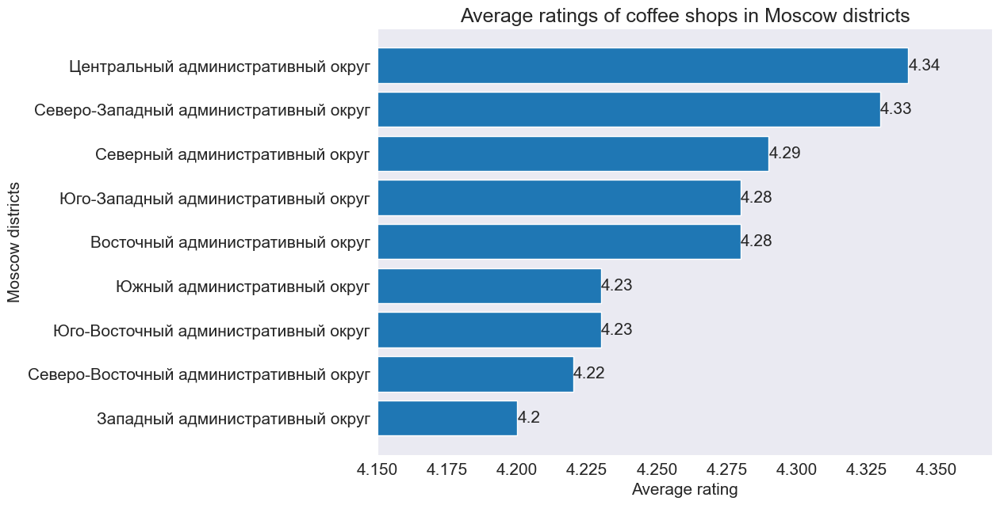

In [43]:
gr_r = df_caf.groupby('district')['rating'].mean().reset_index().sort_values(by='rating')
gr_r['rating'] = round(gr_r['rating'], 2)
plt.figure(figsize=(10, 7))
plt.barh(gr_r['district'], gr_r['rating'])
plt.xlabel('Average rating')  
plt.ylabel('Moscow districts')
plt.title('Average ratings of coffee shops in Moscow districts')
for i, value in enumerate(gr_r['rating']):
    plt.text(value, i, str(value), ha='left', va='center')
plt.xlim(4.15, 4.37)
plt.show()

The ratings are highest in the Central and Northwestern Districts. The lowest is in the West.

### What is the cost of a cappuccino cup worth focusing on when opening and why?

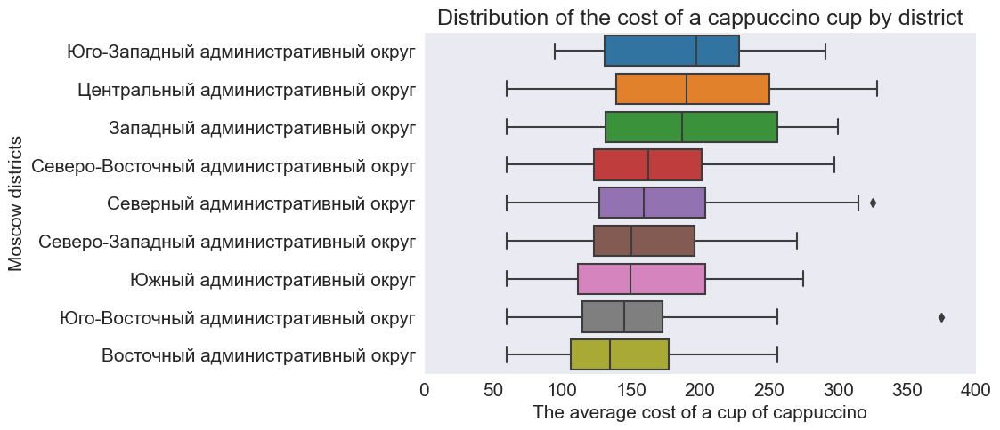

In [44]:
# Let's look at the distribution of cost by district
plt.figure(figsize=(8, 5))
sort_dis_cc = df.groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False).index.tolist()
ax = sns.boxplot(x='middle_coffee_cup', y='district', data=df, order=sort_dis_cc)
plt.xlabel('The average cost of a cup of cappuccino')  
plt.ylabel('Moscow districts')
plt.title('Distribution of the cost of a cappuccino cup by district')
# there is an outlier in the Eastern District, we will cut it off by scaling
plt.xlim(0,400)
plt.show()

The median value differs by region.

In [45]:
# Let's get rid of the outlier, because the extreme value is single and looks like an error in the data
df_caf = df_caf.drop([df_caf['middle_coffee_cup'].idxmax()], axis = 0)

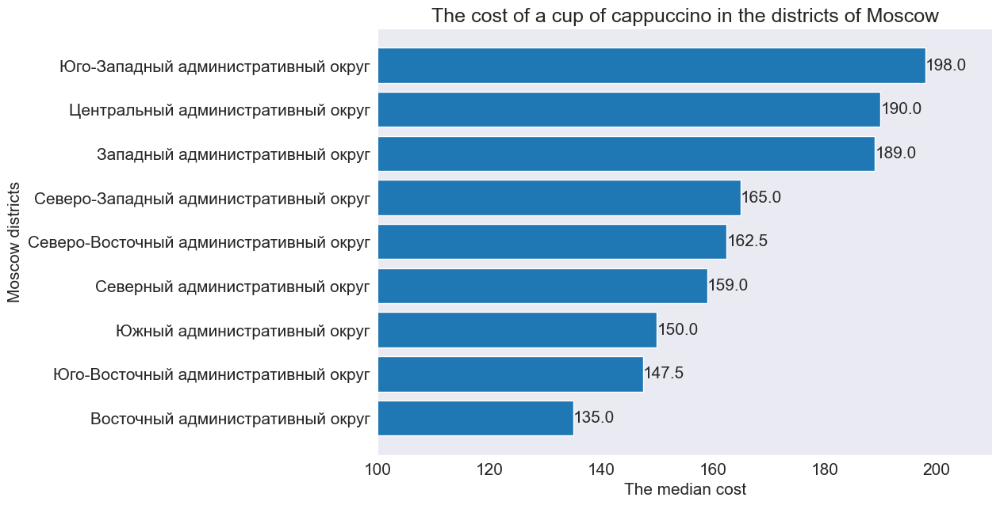

In [46]:
# Let's determine the median cost of a cappuccino cup depending on the area
gr_cost = df_caf.groupby('district')['middle_coffee_cup'].median().reset_index().sort_values(by='middle_coffee_cup')
gr_cost['middle_coffee_cup'] = round(gr_cost['middle_coffee_cup'], 2)
plt.figure(figsize=(10, 7))
plt.barh(gr_cost['district'], gr_cost['middle_coffee_cup'])
plt.xlabel('The median cost')  
plt.ylabel('Moscow districts')
plt.title('The cost of a cup of cappuccino in the districts of Moscow')
for i, value in enumerate(gr_cost['middle_coffee_cup']):
    plt.text(value, i, str(value), ha='left', va='center')
plt.xlim(100, 210)
plt.show()

The median price of a cappuccino cup ranges between 135 and 198 rubles.

When opening a coffee shop, you should focus on the median cost characteristic of the area. It can be expected that this cost indirectly reflects the owners' expenses for the maintenance of an institution in the area.

**Let's look at the dependence of the average cost of a cappuccino cup on the rating**

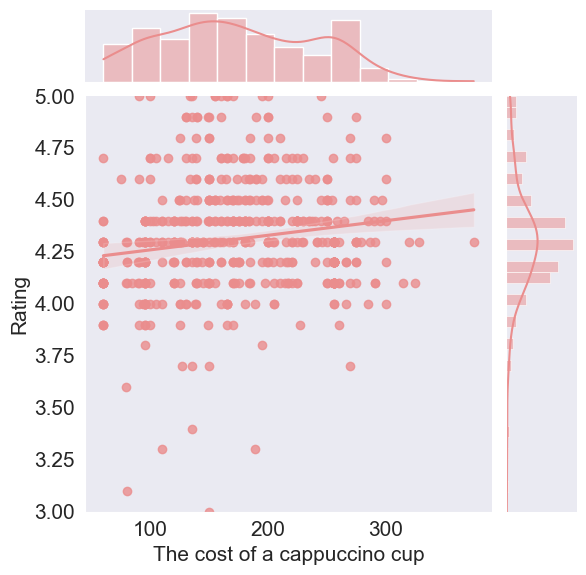

In [47]:
sns.set_style('dark')
ax = sns.jointplot(x='middle_coffee_cup', y='rating', data=df_caf, kind='reg', color='#ea8d8d')
plt.xlabel('The cost of a cappuccino cup')  
plt.ylabel('Rating')
plt.ylim(3, 5)
plt.show()

In [48]:
correlation = df_caf['rating'].corr(df_caf['middle_coffee_cup'])
print("Correlation coefficient:", correlation)

Correlation coefficient: 0.14553767057129025


There is a slight dependence: the higher the rating of the coffee shop, the higher the average cost of a cup of cappuccino. Correlation coefficient: 0.14.

### Recommendation for opening a new establishment.

Overall, coffee shops rank third in popularity among public catering establishments in Moscow.

**Recommendations:**

First and foremost, consider opening a coffee shop in the Northwestern Administrative District (NAD) of Moscow for the following reasons:
- There are only 62 coffee shops in this area, fewer than in any other district.
- The median price of a cappuccino is slightly above the average level—165 RUB. This may indirectly indicate an acceptable level of consumer spending in the area (additional analysis is required).
- The average ratings of establishments are high, which may indicate either a well-established consumer culture or lower expectations regarding quality and service. In any case, it is important to be prepared to provide high-quality services to either match the competitors' level or gain an advantage over them.

## Conclusions.

**Data.**
- There are significant gaps in the data regarding average bill and seating capacity. It is recommended to encourage users and data providers of Yandex Maps and Yandex Business services to fill in this information (reminders/requests, pop-ups, gamification).

**General Market Insights.**
- The data contains mostly cafés and restaurants (28% and 24%, respectively), with coffee shops ranking third at 16.8%. The fewest entries are bakeries and canteens (3% and 3.7%, respectively).
- In terms of median seating capacity, restaurants have the most seats (86), followed by bars (82.5) and coffee shops (80). Bakeries have the fewest seats (50).
- Most of the establishments in the dataset are not part of chains. Chain establishments are more common among coffee shops, pizzerias, and bakeries.
- Most establishments are concentrated in the center of Moscow, with the fewest in the Northwestern Administrative District. In all districts except the Central Administrative District (CAD), cafés are the most common. In the CAD, restaurants are most common, followed by cafés. In all districts except CAD and the Northern Administrative District (NAD), restaurants rank second. In NAD, coffee shops rank second. In all districts except NAD, coffee shops are in third place.
- The average ratings by category do not differ by more than 0.34. Bars/pubs have the highest average rating (4.39), while fast food establishments and cafés have the lowest (4.05 and 4.12, respectively). Ratings are higher in the center of Moscow. The lowest ratings are in the southeastern direction, while ratings increase in the northern and northwestern directions.
- The most expensive establishments (based on the median value of the average bill) are located in the central and western districts of Moscow. It is less expensive in the southeastern direction (where ratings are also lower) and in the northern direction.

## Presentation.

Link to the presentation:

https://disk.yandex.ru/i/f00gMRuBv3bssg
